In [1]:
data_location = './archive'

Import imp libraries

In [2]:

import os
from collections import Counter
import spacy
import torch
import torch.nn as nn
from torch.nn.utils.rnn import pad_sequence
from torch.utils.data import DataLoader,Dataset
import torchvision.transforms as T
import pandas as pd
from PIL import Image
import torch
import numpy as np
import torch.nn as nn
import torch.nn.functional as F
import torch.optim as optim

import torchvision.models as models
from torch.utils.data import DataLoader,Dataset,random_split
import torchvision.transforms as T
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
from EncoderDecoder import EncoderDecoder

In [3]:

caption_file = data_location + '/captions.txt'
df = pd.read_csv(caption_file)
print("There are {} image to captions".format(len(df)))
df.head(7)

There are 40455 image to captions


,image,caption
0,1000268201_693b08cb0e.jpg,A child in a pink dress is climbing up a set o...
1,1000268201_693b08cb0e.jpg,A girl going into a wooden building .
2,1000268201_693b08cb0e.jpg,A little girl climbing into a wooden playhouse .
3,1000268201_693b08cb0e.jpg,A little girl climbing the stairs to her playh...
4,1000268201_693b08cb0e.jpg,A little girl in a pink dress going into a woo...
5,1001773457_577c3a7d70.jpg,A black dog and a spotted dog are fighting
6,1001773457_577c3a7d70.jpg,A black dog and a tri-colored dog playing with...


In [4]:
captionslist = df['caption'].tolist()
#converted entries in all captions to list

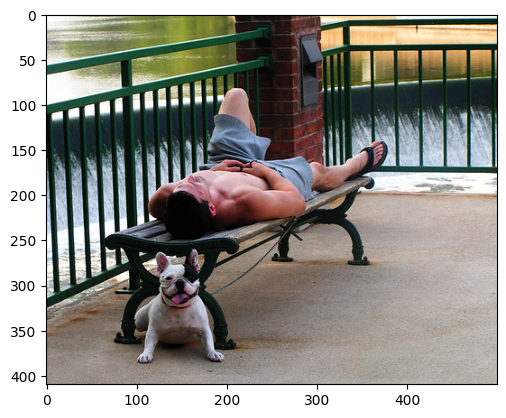

Caption: A shirtless man lies on a park bench with his dog .
Caption: man laying on bench holding leash of dog sitting on ground
Caption: A man in an orange hat starring at something .
Caption: A man wears an orange hat and glasses .
Caption: A man with gauges and glasses is wearing a Blitz hat .


'This basically plots the image and gives 5 different captions'

In [67]:
#PLotting an image at serial no 18

data_idx = 18


image_path = data_location+"/Images/"+df.iloc[data_idx,0]
img=mpimg.imread(image_path)
plt.imshow(img)
plt.show()

for i in range(data_idx,data_idx+5):
    print("Caption:",df.iloc[i,1])

'''This basically plots the image and gives 5 different captions'''

Key observation : For every image there are 5 different captions

Transforming the images


In [6]:
transforms = T.Compose([
    T.Resize((224, 224)),
    T.ToTensor()
   
])
#resized the image to 224*224 

In [7]:
def show_image(inp, title=None):
  
    inp = inp.numpy().transpose((1, 2, 0)) 
    plt.imshow(inp)
    if title is not None:
        plt.title(title)
        
    plt.pause(0.002)  

In [8]:
#prepare the dataset for model training
import matplotlib.pyplot as plt
from Flickr import FlickrDataset
dataset =  FlickrDataset(
    root_dir = data_location+"/Images",
    captions_file = data_location+"/captions.txt",
    transform=transforms
)


In [28]:
train_captions_file = os.path.join(data_location, 'train_captions.txt')
test_captions_file = os.path.join(data_location, 'test_captions.txt')

train_df.to_csv(train_captions_file, sep=',', header=False, index=False)
test_df.to_csv(test_captions_file, sep=',', header=False, index=False)

print(f"Training set saved to {train_captions_file}")
print(f"Testing set saved to {test_captions_file}")

Training set saved to ./archive/train_captions.txt
Testing set saved to ./archive/test_captions.txt


In [9]:
# Initialize the datasets
train_dataset = FlickrDataset(
    root_dir=os.path.join(data_location+ "/Images"),
    captions_file= data_location+ "/train_captions.txt",
    transform=transforms
)

test_dataset = FlickrDataset(
    root_dir=os.path.join(data_location+ "/Images"),
    captions_file= data_location+"/test_captions.txt",
    transform=transforms
)

Loading image from: ./archive/Images/1002674143_1b742ab4b8.jpg


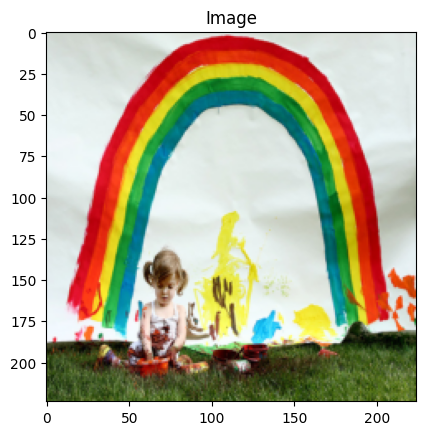

Token: tensor([   1,    4,   23,    6,  111,    5, 1447,   74,    5,   20,   12,    4,
         323,  641,    7,  131,  226,    5,    4, 1301,    8,    2])
Sentence:
['<start>', '.', 'are', 'dog', 'up', 'a', 'summer', 'for', 'a', 'man', 'of', '.', 'backpack', 'stunt', 'with', 'bicycle', 'hanging', 'a', '.', 'jungle', 'the', '<end>']


In [33]:
img, caps = dataset[0]
show_image(img,"Image")
print("Token:",caps)
print("Sentence:")
print([train_dataset.vocab.itos[token] for token in caps.tolist()])

In [10]:
from CapsCollate import CapsCollate
BATCH_SIZE = 4
NUM_WORKER = 1


pad_idx = dataset.vocab.stoi["<PAD>"]

traindata_loader = DataLoader(
    dataset=train_dataset,
    batch_size=BATCH_SIZE,
    num_workers=NUM_WORKER,
    shuffle=True,
    collate_fn=CapsCollate(pad_idx=pad_idx,batch_first=True)
)
testdata_loader = DataLoader(
    dataset=test_dataset,
    batch_size=BATCH_SIZE,
    num_workers=NUM_WORKER,
    shuffle=True,
    collate_fn=CapsCollate(pad_idx=pad_idx,batch_first=True)
)

Loading image from: ./archive/Images/2717686269_80c4b5ac9e.jpg
Loading image from: ./archive/Images/2266144051_614b2d62b0.jpg
Loading image from: ./archive/Images/271177682_48da79ab33.jpg
Loading image from: ./archive/Images/247618600_239eeac405.jpg


Loading image from: ./archive/Images/2360194369_d2fd03b337.jpg
Loading image from: ./archive/Images/1489286545_8df476fa26.jpg
Loading image from: ./archive/Images/2544182005_3aa1332bf9.jpg
Loading image from: ./archive/Images/1787222774_d5c68cce53.jpg
Loading image from: ./archive/Images/2888732432_7e907a3df1.jpg
Loading image from: ./archive/Images/2346523971_d3f1e12ce4.jpg
Loading image from: ./archive/Images/2602085456_d1beebcb29.jpg
Loading image from: ./archive/Images/2921578694_a46ae0d313.jpg


/tmp/ipykernel_8868/3765290033.py:8: UserWarning: Glyph 9 (	) missing from current font.
  plt.pause(0.002)
/usr/local/lib/python3.10/dist-packages/IPython/core/pylabtools.py:170: UserWarning: Glyph 9 (	) missing from current font.
  fig.canvas.print_figure(bytes_io, **kw)


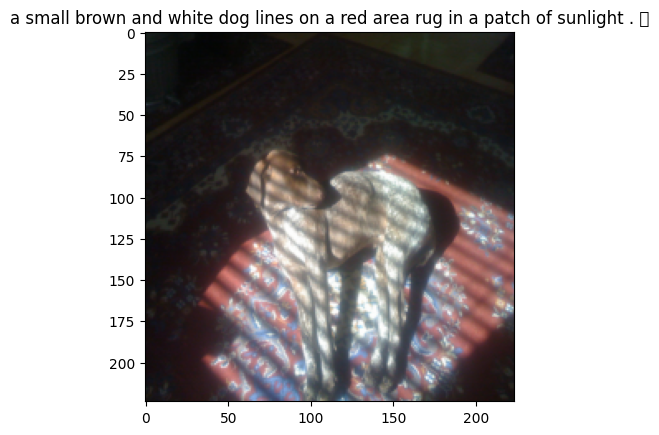

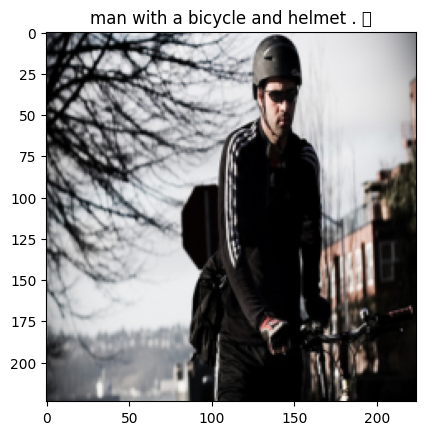

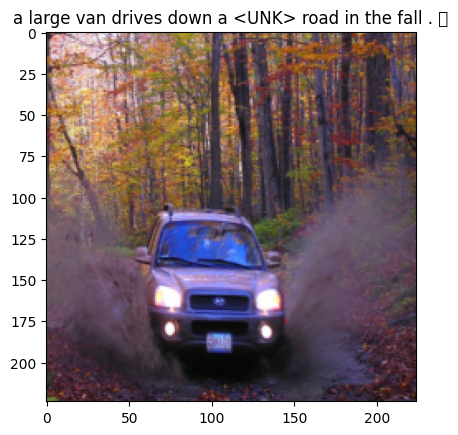

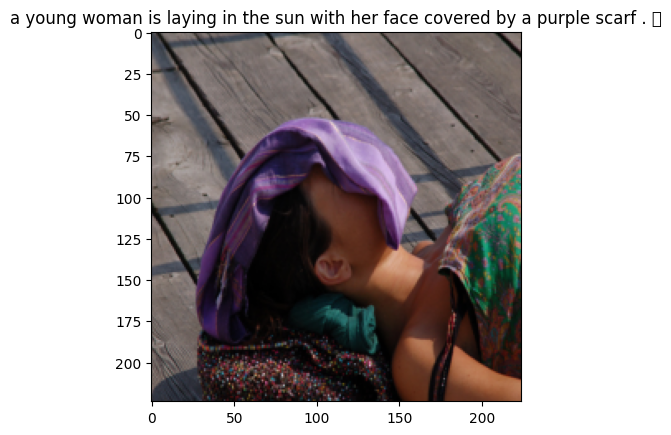

In [74]:
dataiter = iter(traindata_loader)
batch = next(dataiter)
images, captions = batch
for i in range(BATCH_SIZE):
    img,cap = images[i],captions[i]
    caption_label = [train_dataset.vocab.itos[token] for token in cap.tolist()]
    eos_index = caption_label.index('<end>')
    caption_label = caption_label[1:eos_index]
    caption_label = ' '.join(caption_label)
    show_image(img,caption_label)
    plt.show()

In [79]:
#Hyperparams
embed_size=300
vocab_size = len(train_dataset.vocab)
attention_dim=256
encoder_dim=1536
decoder_dim=512
learning_rate = 3e-4

In [56]:
device = 'cpu' # can use cuda as well if it supports
#but make sure that all tensors and other hyperoarameters are in the same device.

In [77]:
print(device)

cpu


In [80]:
# iniating the model, optimisers and lossfunctions
import torch.optim as optim
from EncoderDecoder import EncoderDecoder
import torch.optim as optim
model = EncoderDecoder(
    embed_size=300,
    vocab_size = len(train_dataset.vocab),
    attention_dim=256,
    encoder_dim=encoder_dim,
    decoder_dim=decoder_dim
).to(device)

criterion = nn.CrossEntropyLoss(ignore_index=train_dataset.vocab.stoi["<PAD>"])
optimizer = optim.Adam(model.parameters(), lr=learning_rate)

defining a function to Save the model

In [82]:
#helper function to save the model
def save_model(model,num_epochs):
    model_state = {
        'num_epochs':num_epochs,
        'embed_size':embed_size,
        'vocab_size':len(train_dataset.vocab),
        'attention_dim':attention_dim,
        'encoder_dim':encoder_dim,
        'decoder_dim':decoder_dim,
        'state_dict':model.state_dict()
    }

    torch.save(model_state,'trial.pth')

TRAIN THE MODEL


In [83]:


num_epochs = 6
print_every = 100

for epoch in range(1,num_epochs+1):
    for idx, (image, captions) in enumerate(iter(traindata_loader)):
        image,captions = image.to(device),captions.to(device)
     
        optimizer.zero_grad()
     
        outputs,attentions = model(image, captions)
        targets = captions[:,1:]
        loss = criterion(outputs.view(-1, vocab_size), targets.reshape(-1))
        loss.backward()
        optimizer.step()

        if (idx+1)%print_every == 0:
            print("Epoch: {} loss: {:.5f}".format(epoch,loss.item()))


           
            model.eval()
            # with torch.no_grad():
            #     dataiter = iter(data_loader)
            #     img,_ = next(dataiter)
            #     features = model.encoder(img[0:1].to(device))
            #     caps,alphas = model.decoder.generate_caption(features,vocab=dataset.vocab)
            #     caption = ' '.join(caps)


            model.train()

    
    save_model(model,epoch)

Loading image from: ./archive/Images/2089426086_7acc98a3a8.jpg


Loading image from: ./archive/Images/284441196_8ebb216d0d.jpg
Loading image from: ./archive/Images/2708686056_1b8f356264.jpg
Loading image from: ./archive/Images/2689001252_e0016c89f0.jpg
Loading image from: ./archive/Images/2476214153_99a3998509.jpg
Loading image from: ./archive/Images/2792195540_af5fb95caa.jpg
Loading image from: ./archive/Images/2849194983_2968c72832.jpg
Loading image from: ./archive/Images/1573017288_4d481856e2.jpg
Loading image from: ./archive/Images/2895966469_53e0b29295.jpg
Loading image from: ./archive/Images/116409198_0fe0c94f3b.jpg
Loading image from: ./archive/Images/1028205764_7e8df9a2ea.jpg
Loading image from: ./archive/Images/2346523971_d3f1e12ce4.jpg
Loading image from: ./archive/Images/2929006980_9f9f8f3d21.jpg
Loading image from: ./archive/Images/2694426634_118566f7ab.jpg
Loading image from: ./archive/Images/241345942_ea76966542.jpg
Loading image from: ./archive/Images/2933643390_1c6086684b.jpg
Loading image from: ./archive/Images/2942798367_022df04b49

HELPER FUNCTIONS TO PLOT THE RESULTS

Function to generate captions

In [11]:
def get_caps_from(features_tensors, model_name,dataset):
    model = model_name
    dataset = dataset
    model.eval()
    with torch.no_grad():
        features = model.encoder(features_tensors.to(device))
        caps,alphas = model.decoder.generate_caption(features,vocab=dataset.vocab)
        caption = ' '.join(caps)
        show_image(features_tensors[0],title=caption)

    return caps,alphas

Function to plot image caption

In [12]:

def plot_attention(img, result, attention_plot):
  

    img = img.numpy().transpose((1, 2, 0))
    temp_image = img

    fig = plt.figure(figsize=(15, 15))

    len_result = len(result)
    for l in range(len_result):
        temp_att = attention_plot[l].reshape(7,7)

        ax = fig.add_subplot(len_result//2,len_result//2, l+1)
        ax.set_title(result[l])
        img = ax.imshow(temp_image)
        ax.imshow(temp_att, cmap='gray', alpha=0.7, extent=img.get_extent())


    plt.tight_layout()
    plt.show()

Function to load the pretrained model

In [13]:
from res import enderes
def load_model1(model_path,dataset_name,embed_size,attention_dim,encoder_dim,decoder_dim):
    dataset = dataset_name
    vocab_size = len(dataset.vocab) 
    
    
    model = enderes(
        embed_size=embed_size,
        vocab_size=vocab_size,
        attention_dim=attention_dim,
        encoder_dim=encoder_dim,
        decoder_dim=decoder_dim
    )

   
    state_dict = torch.load(model_path)
    
    model_state_dict = state_dict['state_dict']
    
   
    model.load_state_dict(model_state_dict,strict = False)
    quantized_model = torch.quantization.quantize_dynamic(
        model, {torch.nn.LSTM, torch.nn.Linear}, dtype=torch.qint8
    )
    
  
    quantized_model.eval()
    
    return quantized_model

In [14]:
from EncoderDecoder import EncoderDecoder
def load_model2(model_path,dataset_name):
    dataset = dataset_name
    vocab_size = len(dataset.vocab) 
    
    
    model = EncoderDecoder(
        embed_size=300,
        vocab_size=1620,
        attention_dim=256,
        encoder_dim=1536,
        decoder_dim=512
    )

   
    state_dict = torch.load(model_path)
    
    model_state_dict = state_dict['state_dict']
    
   
    model.load_state_dict(model_state_dict,strict = False)
    quantized_model = torch.quantization.quantize_dynamic(
        model, {torch.nn.LSTM, torch.nn.Linear}, dtype=torch.qint8
    )
    
  
    quantized_model.eval()
    
    return quantized_model

Load the pretrained models

In [137]:
model_path2 = 'trial.pth'

model2 = load_model2(model_path2,train_dataset)

In [15]:
model_path1 ='attention_model_state.pth'
model1= load_model1(model_path1,dataset,300,256,2048,512)

/usr/local/lib/python3.10/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet50_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet50_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


In [85]:
state_dict = torch.load(model_path1)
print(state_dict.keys())



dict_keys(['num_epochs', 'embed_size', 'vocab_size', 'attention_dim', 'encoder_dim', 'decoder_dim', 'state_dict'])


In [106]:
model_state_dict = model2.state_dict()
print(model_state_dict.keys())


odict_keys([])


In [107]:
for name, param in model2.named_parameters():
    if isinstance(param, torch.Tensor):
        print(f"Tensor: {name}, Device: {param.device}")


Test score


RESULTS!!!!! 

for model 1 : resnet50

In [25]:
from rouge_score import rouge_scorer
from torchvision import transforms
from nltk.translate.meteor_score import meteor_score
from nltk.translate.bleu_score import sentence_bleu
def evaluate_image(image_path, references, model, train_dataset):
   
    image = Image.open(image_path).convert('RGB')
    transform = transforms.Compose([
        transforms.Resize((224, 224)),
        transforms.ToTensor()
    ])
    image_tensor = transform(image).unsqueeze(0)
    
    
    caps, alphas = get_caps_from(image_tensor, model, train_dataset)
    generated_caption = ' '.join(caps)
    
    
    scorer = rouge_scorer.RougeScorer(['rouge1', 'rouge2', 'rougeL'], use_stemmer=True)
    
   
    rouge_scores = {
        'rouge1': 0,
        'rouge2': 0,
        'rougeL': 0,
    }
    for ref in references:
        scores = scorer.score(ref, generated_caption)
        for key in rouge_scores:
            rouge_scores[key] += scores[key].fmeasure
    
    
    num_references = len(references)
    for key in rouge_scores:
        rouge_scores[key] /= num_references
    
    
    tokenized_references = [ref.split() for ref in references]
    tokenized_generated_caption = generated_caption.split()
    
    
    meteor = meteor_score(tokenized_references, tokenized_generated_caption)
    bleu_score1 = sentence_bleu(tokenized_references, tokenized_generated_caption, weights=(1,0,0,0))
    bleu_score2 = sentence_bleu(tokenized_references, tokenized_generated_caption, weights=(0.5,0.5,0,0))
    bleu_score3 = sentence_bleu(tokenized_references, tokenized_generated_caption, weights=(0.33,0.33,0.33,0))
    bleu_score4 = sentence_bleu(tokenized_references, tokenized_generated_caption, weights=(0.25,0.25,0.25,0.25))
    return meteor, bleu_score1,bleu_score2,bleu_score3,bleu_score4, rouge_scores

In [20]:
#accessing reference- test.txt file contains reference captions for test images
with open('./test/test.txt', 'r') as file:
    lines = file.readlines()

In [21]:
device = 'cpu'

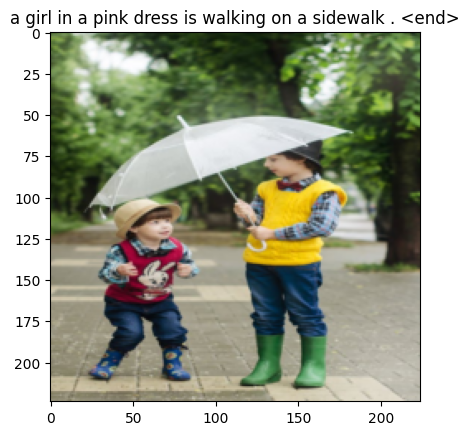

/usr/local/lib/python3.10/dist-packages/nltk/translate/bleu_score.py:552: UserWarning: 
The hypothesis contains 0 counts of 2-gram overlaps.
Therefore the BLEU score evaluates to 0, independently of
how many N-gram overlaps of lower order it contains.
Consider using lower n-gram order or use SmoothingFunction()
  warnings.warn(_msg)
/usr/local/lib/python3.10/dist-packages/nltk/translate/bleu_score.py:552: UserWarning: 
The hypothesis contains 0 counts of 3-gram overlaps.
Therefore the BLEU score evaluates to 0, independently of
how many N-gram overlaps of lower order it contains.
Consider using lower n-gram order or use SmoothingFunction()
  warnings.warn(_msg)
/usr/local/lib/python3.10/dist-packages/nltk/translate/bleu_score.py:552: UserWarning: 
The hypothesis contains 0 counts of 4-gram overlaps.
Therefore the BLEU score evaluates to 0, independently of
how many N-gram overlaps of lower order it contains.
Consider using lower n-gram order or use SmoothingFunction()
  warnings.warn(_

METEOR score: 0.1724137931034483
BLEU 1 score: 0.15384615384615385
BLEU 2 score: 5.850803834986753e-155
BLEU 3 score: 4.7971789246899324e-204
BLEU 4 score: 1.1409851298103347e-231
ROUGE scores: {'rouge1': 0.15250544662309368, 'rouge2': 0.0, 'rougeL': 0.15250544662309368}


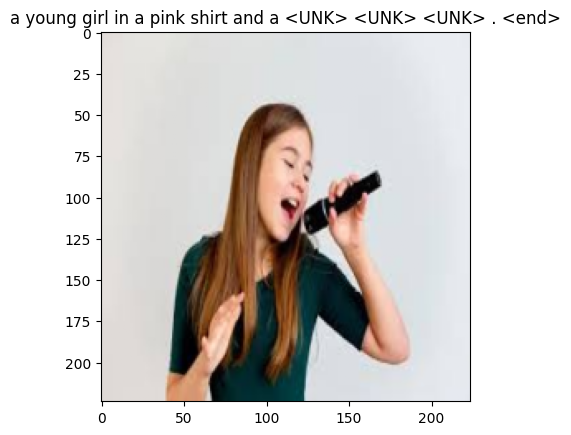

METEOR score: 0.4331450094161958
BLEU 1 score: 0.3571428571428572
BLEU 2 score: 0.2870846258816073
BLEU 3 score: 0.19326657319539928
BLEU 4 score: 3.515974884267917e-78
ROUGE scores: {'rouge1': 0.3555555555555556, 'rouge2': 0.19907407407407407, 'rougeL': 0.3555555555555556}


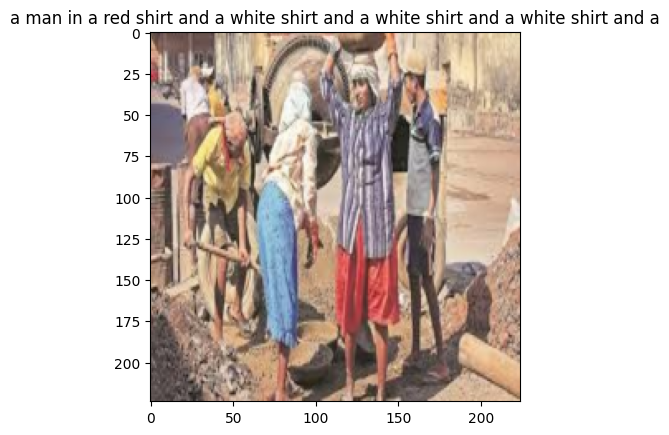

METEOR score: 0.09090909090909091
BLEU 1 score: 0.05000000000000001
BLEU 2 score: 3.3354713748637937e-155
BLEU 3 score: 3.310605453801633e-204
BLEU 4 score: 8.614911585158347e-232
ROUGE scores: {'rouge1': 0.044444444444444446, 'rouge2': 0.0, 'rougeL': 0.044444444444444446}


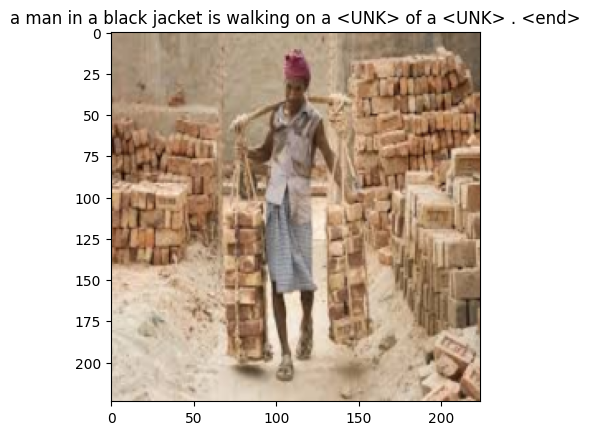

METEOR score: 0.2884615384615385
BLEU 1 score: 0.1875
BLEU 2 score: 0.11180339887498951
BLEU 3 score: 7.024314801411676e-103
BLEU 4 score: 4.987693055201041e-155
ROUGE scores: {'rouge1': 0.2355889724310777, 'rouge2': 0.11351909184726522, 'rougeL': 0.2355889724310777}


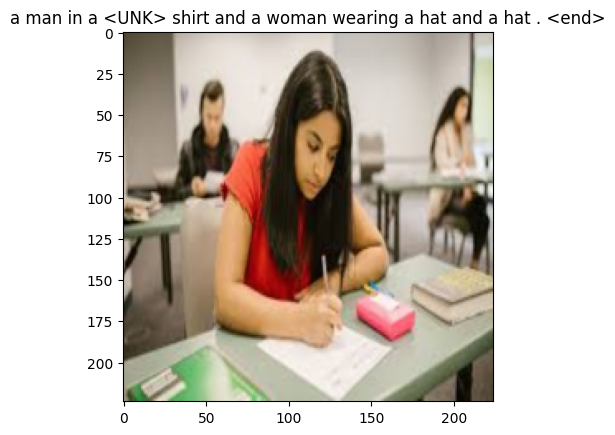

METEOR score: 0.14018691588785046
BLEU 1 score: 0.17647058823529413
BLEU 2 score: 6.2662595914768024e-155
BLEU 3 score: 5.019369816254929e-204
BLEU 4 score: 1.1808001696991507e-231
ROUGE scores: {'rouge1': 0.11025641025641025, 'rouge2': 0.0, 'rougeL': 0.11025641025641025}


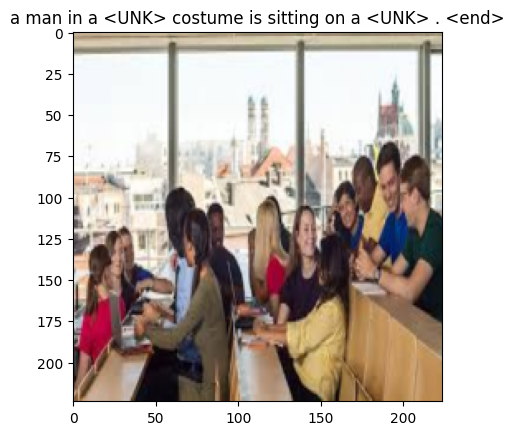

METEOR score: 0.10204081632653061
BLEU 1 score: 0.07692307692307693
BLEU 2 score: 4.1371430671115046e-155
BLEU 3 score: 3.816330853691048e-204
BLEU 4 score: 9.594503055152632e-232
ROUGE scores: {'rouge1': 0.075, 'rouge2': 0.0, 'rougeL': 0.075}


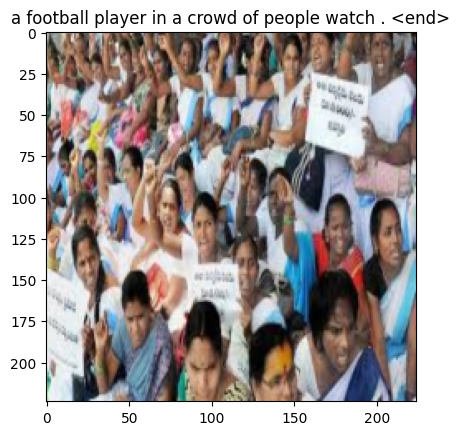

METEOR score: 0.49342105263157904
BLEU 1 score: 0.18181818181818182
BLEU 2 score: 0.13483997249264845
BLEU 3 score: 7.948844018477227e-103
BLEU 4 score: 5.477489369001354e-155
ROUGE scores: {'rouge1': 0.2564102564102564, 'rouge2': 0.0606060606060606, 'rougeL': 0.2051282051282051}


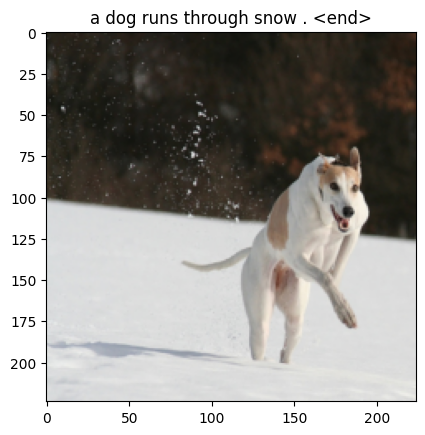

METEOR score: 0.4821802935010482
BLEU 1 score: 0.7142857142857143
BLEU 2 score: 0.3450327796711771
BLEU 3 score: 1.4777858300981341e-102
BLEU 4 score: 8.761982757198608e-155
ROUGE scores: {'rouge1': 0.5986467236467236, 'rouge2': 0.14989177489177488, 'rougeL': 0.5986467236467236}


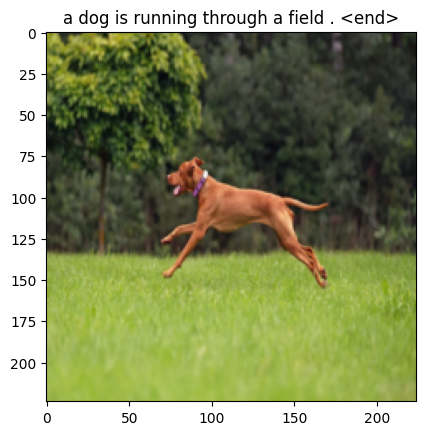

METEOR score: 0.5952380952380953
BLEU 1 score: 0.5555555555555556
BLEU 2 score: 0.5270462766947299
BLEU 3 score: 0.43338883631190117
BLEU 4 score: 0.33913260910307497
ROUGE scores: {'rouge1': 0.6098901098901099, 'rouge2': 0.3354978354978355, 'rougeL': 0.6098901098901099}


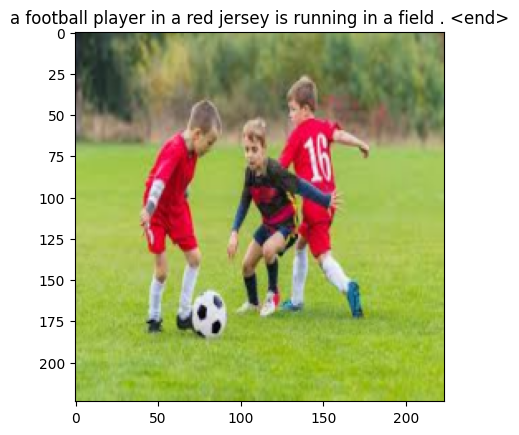

METEOR score: 0.738016136687233
BLEU 1 score: 0.5714285714285714
BLEU 2 score: 0.4688072309384954
BLEU 3 score: 0.38386316691836725
BLEU 4 score: 0.2658483576665877
ROUGE scores: {'rouge1': 0.4004830917874396, 'rouge2': 0.23893065998329155, 'rougeL': 0.4004830917874396}


In [26]:
for line in lines:
    parts = line.strip().split('|')
    image_path = parts[0].strip()
    references = [ref.strip() for ref in parts[1:]]
    
    meteor, bleu_score1,bleu_score2,bleu_score3,bleu_score4, rouge_scores = evaluate_image(image_path, references, model1, dataset)
    print(f"METEOR score: {meteor}")
    print(f"BLEU 1 score: {bleu_score1}")
    print(f"BLEU 2 score: {bleu_score2}")
    print(f"BLEU 3 score: {bleu_score3}")
    print(f"BLEU 4 score: {bleu_score4}")
    print(f"ROUGE scores: {rouge_scores}")